# PARTE I

## Plantea un diseño de test de hipótesis que te gustaría aplicar.

Un posible test de hipotsis que me gustaria hacer seria siguiendo mi trabajo de final de grado, en él, creaba un modelo de regresion para determinar el número de mensajeros que se necesitarian para un dia en una empresa de mensajeria. Después organizaba las entregas por clusters en base a

El test de hipótesis que me gustaria aplicar seria el de comprobar si la entrega de productos basada en mi prediccion con la posterior organización de los datos y aplicando algún algoritmo basado en el TSP para determinar la ruta de entrega, sería más rápida y eficiente que la actual de la empresa.

En esta, la hipótesis nula H0 seria que no hay una diferencia importante respecto a la entrega habitual de la empresa y H1 seria que si la hay. Como variable de interes usaria el tiempo total de reparto entre los distintos mensajeros, que la sacaria de la muestra de datos históricos con los que entrené el modelo de regresión. Como alfa, usaría el típico valor de 0.05 y una vez todo hecho, me pondria a realizar el test y encontrar los valores críticos, el p-value y de los resultados obtenidos sacaría una conclusión.

## Indica la respuesta correcta de este pequeño test y justifica tu respuesta:

### ¿Cuál es el propósito del valor crítico en un test de hipótesis?

Marcar el límite entre rechazar y no rechazar la hipótesis nula.

La región critica es la región de los valores muestrales a partir de los cuales se rechaza la hipótesis nula. Por lo tanto, el valor critico es ese punto en el cual se marca el límite a partir de dónde se rechazará la hipotesis nula.

### ¿Qué representa el Error Tipo II?

No rechazar incorrectamente la hipótesis nula.

La diferencia entre el error tipo I y el tipo I, es que el tipo I es un falso positivo, es decir, que se rechaza la hipotesis nula cuando debería aceptarse. Mientras que el tipo II es un falso negativo, es decir, que se acepta (no se rechaza) la hipótesis nula cuando es falsa.

### Si realizas un test de una cola y obtienes un p-valor de 0.02 con un nivel de significancia de 0.05, ¿qué decisión tomarías?

Rechazar la hipótesis nula.

Por definición, el nivel de significancia es es el límite para juzgar un resultado como estadísticamente significativo. Por lo tanto, cualquier p-valor inferior a este nivel de significancia, descarta la hipótesis nula.

### ¿Cuál es la relación entre nivel de significancia y la probabilidad de cometer un Error Tipo I?

Todas son incorrectas puesto que aumentar el nivel de significancia significa incrementar la zona de rechazo de H0, lo cual aumenta la probabilidad de que se rechaze la hipótesis nula, siendo esto, un error de tipo I.

Por lo tanto, la respuesta correcta seria: Aumentar el nivel de significancia aumenta la probabilidad de cometer un error Tipo I.

# PARTE II

## Exploración de los datos: análisis descriptivos de los datos, graficación y conclusiones ¿siguen una distribución normal?

In [93]:
library(ggplot2)
#install.packages('gridExtra')
library(gridExtra)

Antes de empezar con la graficacion voy a usar las funciones de str y summary para tratar de entender un poco mejor el dataset con el que estoy trabajando.

In [7]:
data <- read.csv(file='202311s20_b2b_ecommerce_sales_data.csv', header=TRUE, sep=',', dec='.')
str(data)

'data.frame':	11786 obs. of  3 variables:
 $ Reference  : int  570554 567869 539441 542736 573589 540833 560217 542136 549534 540945 ...
 $ Order.Value: num  0.38 0.4 0.42 0.55 0.55 0.65 0.79 0.84 0.84 0.85 ...
 $ Group      : int  1 0 0 0 0 1 1 1 1 0 ...


In [8]:
summary(data)

   Reference       Order.Value          Group       
 Min.   :536365   Min.   :   0.38   Min.   :0.0000  
 1st Qu.:547564   1st Qu.: 528.66   1st Qu.:0.0000  
 Median :558626   Median :2376.76   Median :1.0000  
 Mean   :558883   Mean   :3104.26   Mean   :0.5332  
 3rd Qu.:570289   3rd Qu.:5244.93   3rd Qu.:1.0000  
 Max.   :581587   Max.   :9476.80   Max.   :1.0000  

De estas funciones se pueden ver un par de cosas interesantes, primero de todo, se trata de un dataset bastantes sencillo de 3 columnas que indican un id único de cada compra, el valor de la compra, y el grupo al que pertenece (pre o post aplicación del sistema recomendador). 

Además de esto, tambien podemos observar como el rango de precios de las compras es bastante grande con un valor mínimo de 0.38 y un valor máximo de 9476.80, además, observando el valor de la mediana, el cuál es 2376.76, podemos decir que la mayoria de las muestras se comprimen en un rango inferior a la media, por lo tanto hay muchas mas compras pequeñas que grandes.

A continuación, me dispongo a graficar los datos en histogramas y boxplots para apreciar mejor la distribución de estos datos y tratar de determinar el tipo de distribución del que se trata.

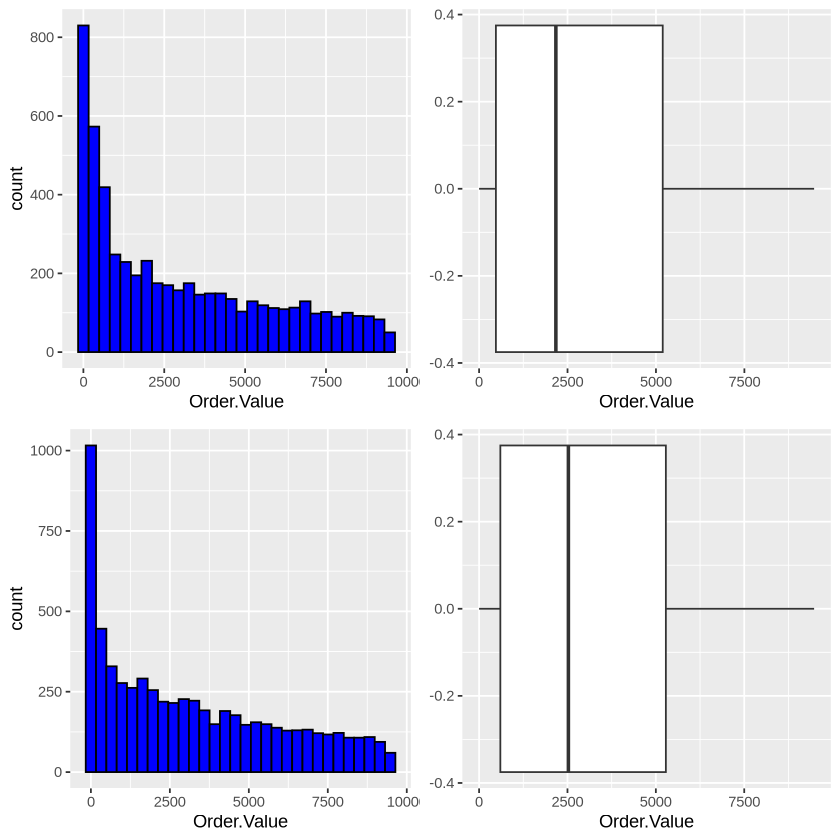

In [32]:
sub_group0 = data[data$Group == 0,]
sub_group1 = data[data$Group == 1,]
a = ggplot(sub_group0, aes(x=Order.Value)) + geom_histogram(bins=30,color="black", fill="blue")
b = ggplot(sub_group1, aes(x=Order.Value)) + geom_histogram(bins=30,color="black", fill="blue")
c = ggplot(sub_group0, aes(x=Order.Value)) + geom_boxplot()
d = ggplot(sub_group1, aes(x=Order.Value)) + geom_boxplot()
grid.arrange(a,c,b,d)

En estos graficos podemos observar como las muestras parecen seguir algo parecido a una exponencial invertida, ya que a medida que aumenta el valor, disminuye la cantidad de muestras. Tambien podemos ver como efectivamente, la gran mayoria de las muestras se concentran en los valores pequeños, tal y como habia intuido anteriormente.

En cuánto a si se trata o no de una distribución normal, de momento no lo parece mucho, sin embargo quiero asegurarme más antes de dar un veredicto así que realizaré un test de shapiro y graficaré un qqplot para tratar de arrojar un poco más de luz sobre este aspecto.


	Shapiro-Wilk normality test

data:  sample(data$Order.Value, size = 5000, replace = FALSE)
W = 0.89437, p-value < 2.2e-16


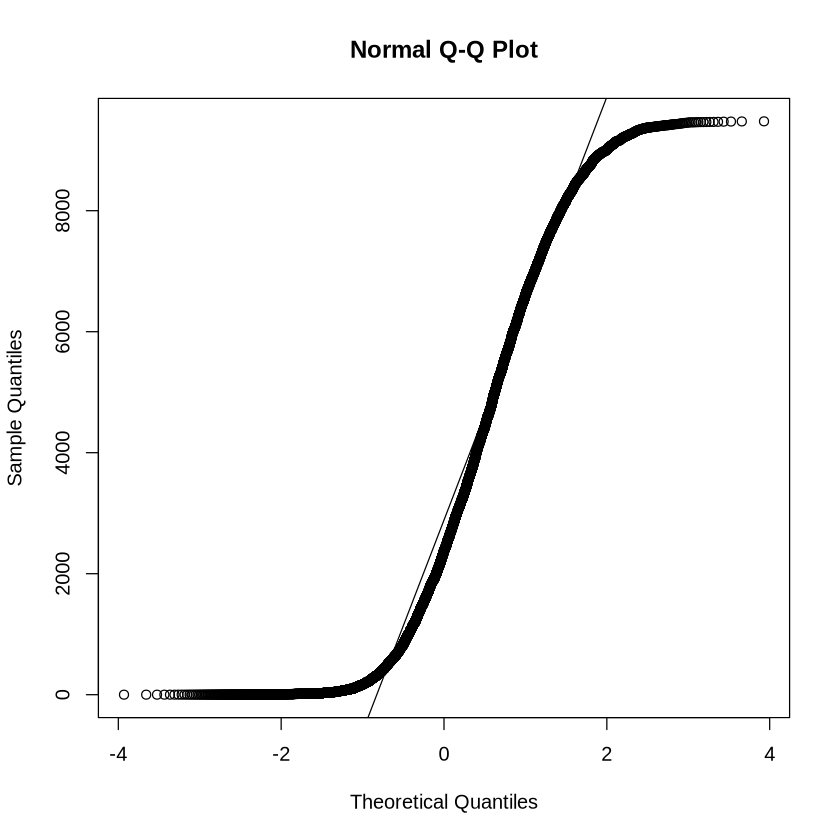

In [97]:
qqnorm(data$Order.Value)
qqline(data$Order.Value)
shapiro.test(sample(data$Order.Value, size = 5000, replace = FALSE))

Como se puede ver con el test de shapiro, el valor p es muy inferior a un nivel de significancia del 95%, con ese resultado y observando el grafico del qqplot de arriba, podríamos determinar que en este caso, con las muestras que tenemos la variable no sigue una normal todavía. Si nos fijamos en las colas del qqplot, tanto las de arriba como en las de abajo, podemos apreciar como se alejan muhcho de la recta que delimitaria una distribucion normal.

Sin embargo, no me parece que sea suficiente como para descartar completamente la normalidad de la distribución, ya que aunque es cierto que los valores de las muestras como tal no la siguen, nada indica que estos mismos valores mediante transformaciones no puedan seguirla. Y eso es lo que voy a hacer a continuación.

Para poder obtener un resultado más óptimo del test de hipótesis me dispongo a transformar la variable aplicando una raiz cúbica en sus muestras, a continuación dejo el código que he usado y las nuevas gráficas obtenidas después de la transformación.

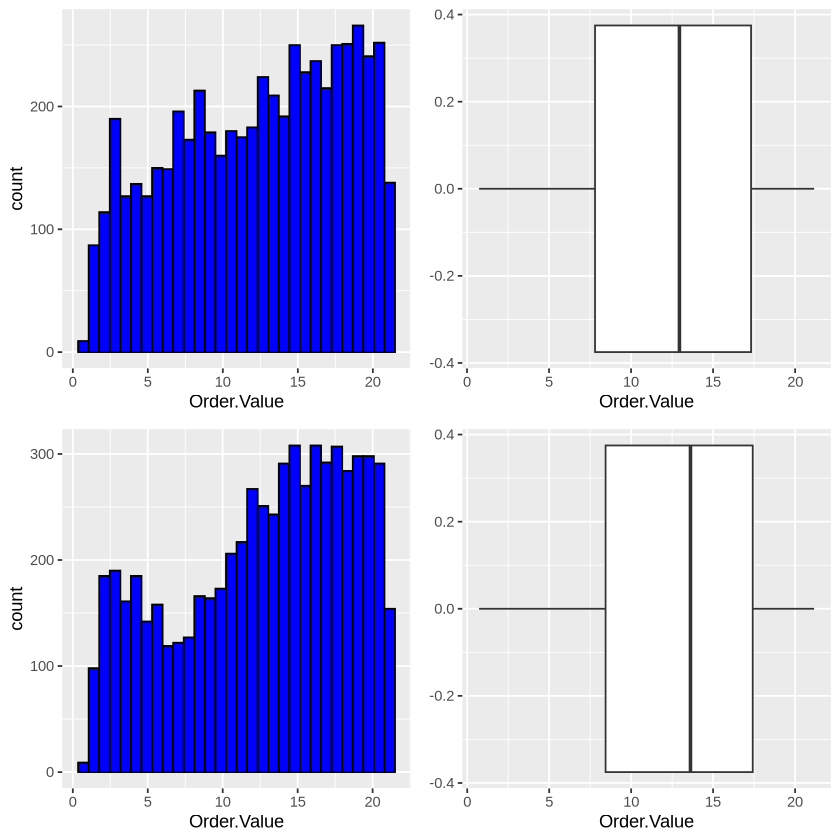

In [91]:
sub_group0 = (data[data$Group == 0,]) ^ (1/3)
sub_group1 = (data[data$Group == 1,]) ^ (1/3)
a = ggplot(sub_group0, aes(x=Order.Value)) + geom_histogram(bins=30,color="black", fill="blue")
b = ggplot(sub_group1, aes(x=Order.Value)) + geom_histogram(bins=30,color="black", fill="blue")
c = ggplot(sub_group0, aes(x=Order.Value)) + geom_boxplot()
d = ggplot(sub_group1, aes(x=Order.Value)) + geom_boxplot()
grid.arrange(a,c,b,d)

Esto ya es otra cosa, aqui ya podemos apreciar algo más parecido a una normal en la distribución observable en los histogramas de ambos grupos. Además, también podemos ver a través del boxplot como la mediana de la distribucion se ha centrado en comparación con los boxplots anteriores, indicando un mayor parecido a una distribucion normal.

Ahora, volveré a realizar el test de shapiro y el qqplot para ver como han cambiado las cosas.


	Shapiro-Wilk normality test

data:  sample((data$Order.Value), size = 5000, replace = FALSE)^(1/3)
W = 0.94684, p-value < 2.2e-16


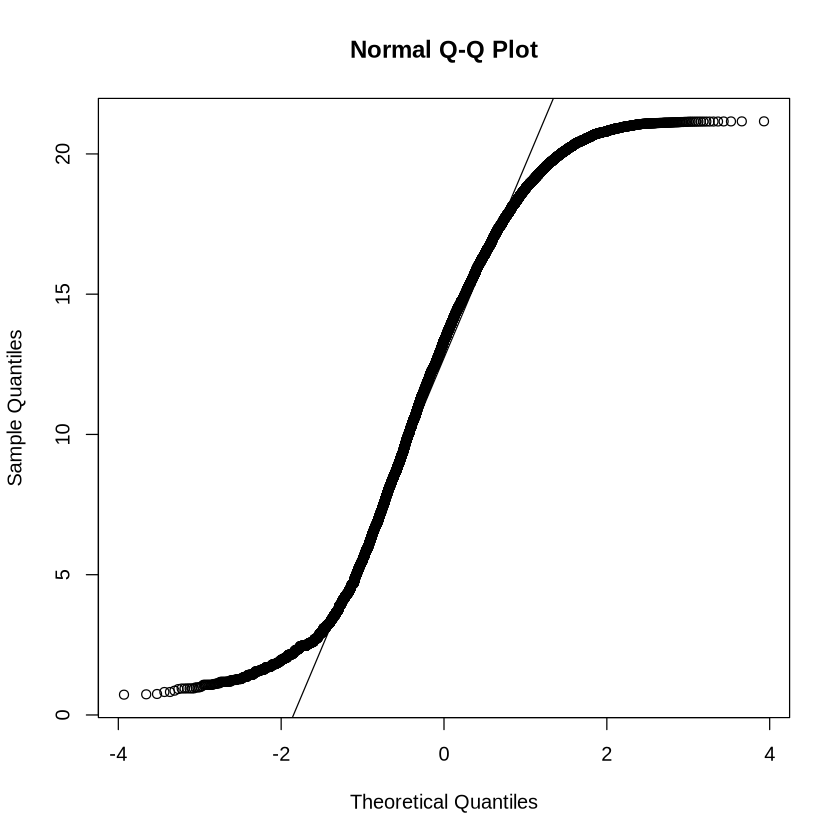

In [119]:
qqnorm((data$Order.Value) ^ (1/3))
qqline((data$Order.Value) ^ (1/3))
shapiro.test(sample((data$Order.Value), size = 5000, replace = FALSE) ^(1/3))

Como se podía observar a través de los histogramas, con este qqplot podemos observar como tras la transformación estos datos se acercan mucho más a seguir una distribución normal, puesto que los puntos y las colas caen mucho mas cerca de la recta que representa la normalidad de la distribución. En cambio, en cuánto al test de shapiro, no observamos una diferencia significante aunque esto posiblemente se deba al hecho de que ambos p valores son muy pequeños y el cambio de tener lugar en una unidad de potencia muy pequeña del valor.

Así que tras observar los cambios, podriamos llegar a concluir que si siguieramos aplicando transformaciones a los datos y normalizandolos, podríamos llegar a obtener algo muy parecido a normal. Con esto, junto con el teorema del limite central que establece que, dada una muestra aleatoria suficientemente grande de la población, la distribución de las medias muestrales seguirá una distribución normal, por lo tanto, nuestra muestra también acabará siguiendo una normal.

## Diseña un test de hipótesis: ¿cuál es nuestro objetivo? ¿se trataría de un test de 2 colas? ¿Qué estadístico debemos usar para este Test?

El test a realizar tendrá el objetivo de determinar si el nuevo sistema de recomendación de producto a sus usuarios surge un efecto en las compras de estos. En este test la hipótesis nula (H0) será que no hay un incremento de las ventas con el grupo con el sistema recomendador, mientras que H1 será que si la hay. En lo que refiere al nivel de significancia, le daré un valor a alfa de 0,05 ya que es el valor estándar en este tipo de test. 


Para este test, el tamaño de la muestra N > 10000 es mas que suficientemente grande para una prueba Z stat, sin embargo, al no conocer la desviación estandar poblacional, usaré una prueba t, la cual solo será de 1 cola, ya que el único caso que nos interesa para descartar H0 es aquel en el que se incrementan las ventas, por lo tanto al fijar-nos solo en uno de los signos de la potencial diferencia, lo conveniente es realizar un test de 1 cola.

En cuánto al estadístico, puesto que el objetivo del enunciado es aumentar el valor medio de las ventas, usaré la media de los valores de las ventas como estadístico.

## Validación y ejecución del test de hipótesis

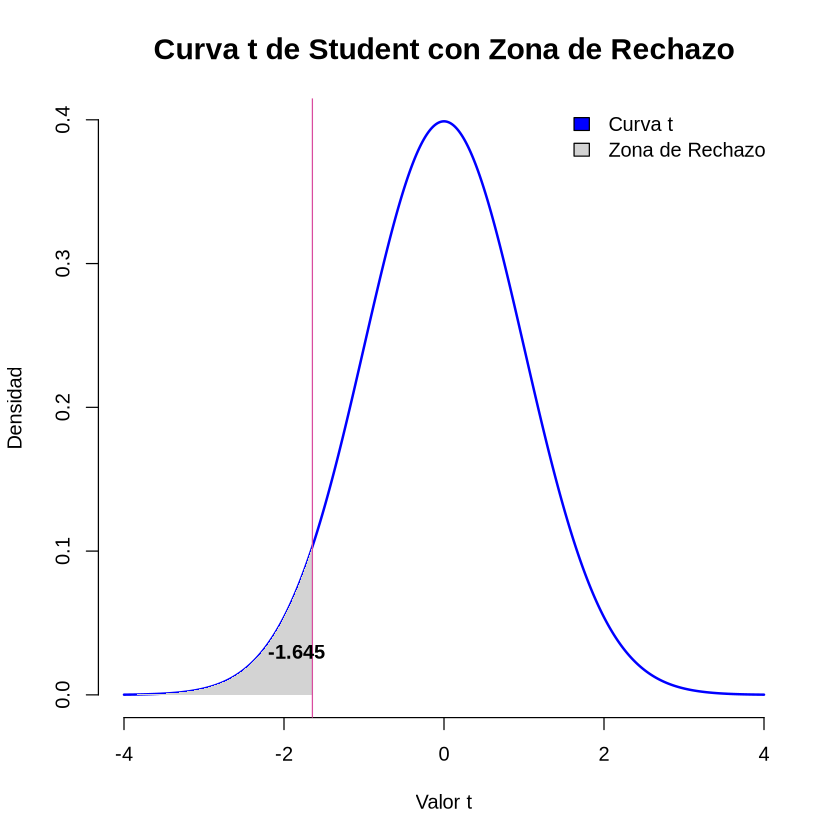

In [120]:
n_grados = 11786 -2
nivel_significancia = 0.05
# Valores críticos
valor_critico_superior = qt(1 - nivel_significancia, df = n_grados)
valor_critico_inferior = -valor_critico_superior
# Generamos y dibujamos una curva t
x = seq(-4, 4, length.out = 1000)
y = dt(x, df = n_grados)
plot(x, y, type = "l", lwd = 2, col = "blue", xlab = "Valor t", ylab = "Densidad", bty = "n")
# Pintamos el área bajo la curva 
x_area_inferior = x[(x >= min(x)) & (x < valor_critico_inferior)]
y_area_inferior = dt(x_area_inferior, df = n_grados)
polygon(c(x_area_inferior,valor_critico_inferior,min(x)),c(y_area_inferior, 0, 0),col = "lightgray", border = NA)
# Valores críticos
abline(v = c(valor_critico_inferior), col = "#d94c9f", lty = 1)
# Añadimos valores críticos
text(valor_critico_inferior - 0.2, 0.03, round(valor_critico_inferior, 3), col = "black", font = 2)
# Título y leyenda
title("Curva t de Student con Zona de Rechazo", cex.main = 1.5)
legend("topright", legend = c("Curva t", "Zona de Rechazo"), fill = c("blue", "lightgray"), cex = 1, bty = "n")

Gracias a este gráfico podemos observar por que valores de t decidiremos si rechazar o no la hipótesis nula. A continuación me dispongo a realizar el test t.

In [112]:
print("T TEST DE MEDIAS INDEPENDIENTES CON DOS MUESTRAS DE UNA COLA")
tt=t.test(sub_group0$Order.Value, sub_group1$Order.Value, 
       paired = F, 
       alternative = "less",
       conf.level = 0.95)
print(tt)

[1] "T TEST DE MEDIAS INDEPENDIENTES CON DOS MUESTRAS DE UNA COLA"

	Welch Two Sample t-test

data:  sub_group0$Order.Value and sub_group1$Order.Value
t = -2.9281, df = 11584, p-value = 0.001708
alternative hypothesis: true difference in means is less than 0
95 percent confidence interval:
       -Inf -0.1337969
sample estimates:
mean of x mean of y 
 12.36265  12.66797 



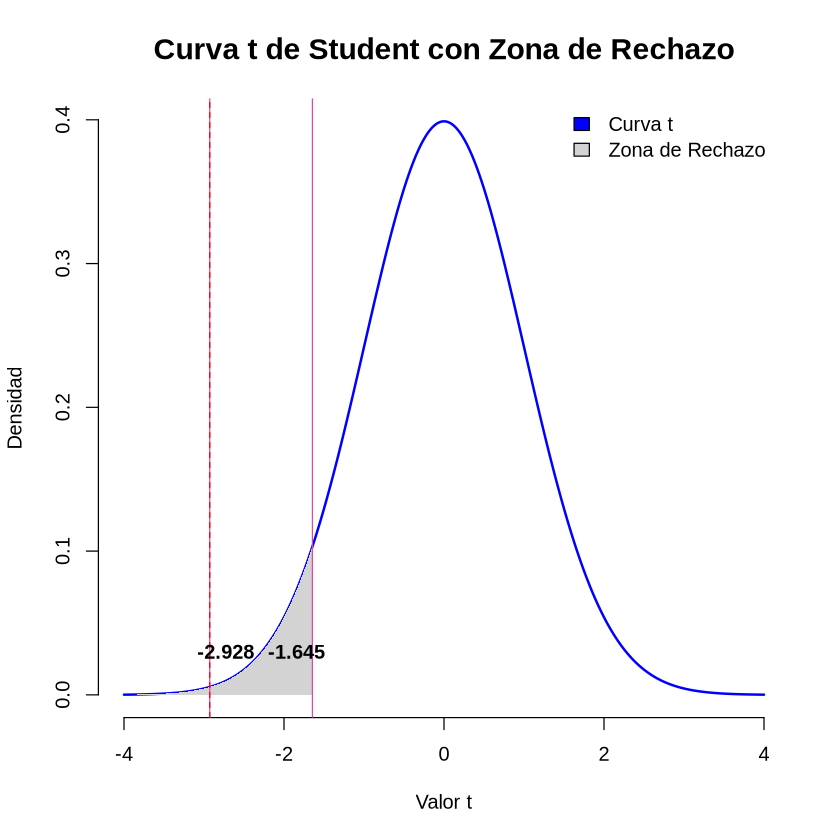

In [121]:
n_grados = 11786*2 -2
nivel_significancia = 0.05
# Valores críticos
valor_critico_superior = qt(1 - nivel_significancia, df = n_grados)
valor_critico_inferior = -valor_critico_superior
# Generamos y dibujamos una curva t
x = seq(-4, 4, length.out = 1000)
y = dt(x, df = n_grados) 
plot(x, y, type = "l", lwd = 2, col = "blue", xlab = "Valor t", ylab = "Densidad", bty = "n")
# Pintamos el área bajo la curva
x_area_inferior = x[(x >= min(x)) & (x < valor_critico_inferior)]
y_area_inferior = dt(x_area_inferior, df = n_grados)
polygon(c(x_area_inferior,valor_critico_inferior,min(x)),c(y_area_inferior, 0, 0),col = "lightgray", border = NA)
# Valores críticos
abline(v = c(valor_critico_inferior,tt$statistic), col = "#d94c9f", lty = 1)
abline(v = c(tt$statistic), col = "red", lty = 2)
# Añadimos valores críticos
text(valor_critico_inferior - 0.2, 0.03, round(valor_critico_inferior, 3), col = "black", font = 2)
text(tt$statistic + 0.2, 0.03, round(tt$statistic, 3), col = "black", font = 2)
# Título y leyenda
title("Curva t de Student con Zona de Rechazo", cex.main = 1.5)
legend("topright", legend = c("Curva t", "Zona de Rechazo"), fill = c("blue", "lightgray"), cex = 1, bty = "n")

Tras observar el valor t y en que lugar del grafico cae, podemos determinar que rechazaremos la hipótesis nula.

## Conclusiones: ¿Recomendarías el uso de este sistema de recomendación? (justifica tu respuesta) ¿Qué factores se deben tener en cuenta para la toma de esta decisión?

Tras este análisis yo recomendaria el uso del sistema de recomendación. Para ello hay varios indicadores en los que podemos fijarnos, el primero de todos, es que la media y mediana de precios del grupo que usa el sistema de recomendación, es mayor a la media y mediana de precios del grupo que no. Esto por si solo no tiene el suficiente peso para tomar una decisión ya que esto podria deberse a varios factores como una falta de muestras o que simplemente se han vendido menos productos baratos. 

Sin embargo, tras realizar el test t, hemos podido apreciar como el valor t de la prueba supera con creces el límite marcado por los valores críticos y en nivel de significancia, indicando que rechazando la hipótesis nula y usando el sistema de recomendación, almenos el 95% de las veces, incrementariamos las ventas.

Así que, tras fijarnos en todos los indicadores de los que he hablado a lo largo del trabajo, y sobretodo teniendo en cuenta el resultado del test de hipótesis realizado, la conclusión a la que llego es que el uso del sistema de recomendación es totalmente recomendable.